<a href="https://colab.research.google.com/github/Jawakar-7/StableDiffusion-Models/blob/main/Stabledfn_mdlreport.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
! git clone https://github.com/Jawakar-7/StableDiffusion-Models.git

Cloning into 'StableDiffusion-Models'...
remote: Enumerating objects: 30, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 30 (delta 4), reused 12 (delta 0), pack-reused 0
Receiving objects: 100% (30/30), 28.71 MiB | 22.41 MiB/s, done.
Resolving deltas: 100% (4/4), done.


In [2]:
import warnings
warnings.filterwarnings("ignore")

## Stable Diffusion :
Stable Diffusion is a text-to-image latent diffusion model created by the researchers and engineers from CompVis, Stability AI and LAION. It's trained on 512x512 images from a subset of the LAION-5B database. This model uses a frozen CLIP ViT-L/14 text encoder to condition the model on text prompts. With its 860M UNet and 123M text encoder, the model is relatively lightweight and can run on many consumer GPUs.
Here the first Model I'm trying to use is a  
###'CompVis/stable-diffusion-v1-4" model


In [3]:
!nvidia-smi
#to check if the model is connected with a GPU runtime


/bin/bash: line 1: nvidia-smi: command not found


### Install Dependencies

In [4]:
!pip install diffusers
!pip install transformers scipy ftfy accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.2/244.2 kB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 32.8 MB/s eta 0:00:00


### Pipeline
StableDiffusionPipeline is an end-to-end inference pipeline that you can use to generate images from text with just a few lines of code.

First, we load the pre-trained weights of all components of the model

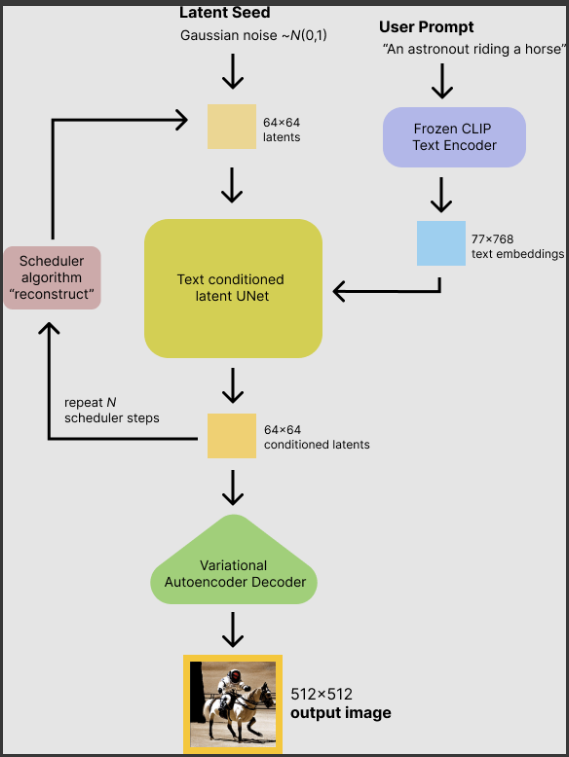

In [5]:
import torch
from diffusers import StableDiffusionPipeline

### Importing pretrained CompVis/stable-diffusion-v1-4 Model

In [6]:
mypipe=StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",torch_dtype=torch.float16)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [7]:
mypipe=mypipe.to("cuda")

RuntimeError: ignored

Now that we have  moved our model to GPU we will try and create images using Stable Diffusion API

In [ ]:
prompt="Batman VS superman"

In [ ]:
img1=mypipe(prompt).images[0]

In [ ]:
img1

Running the above cell multiple times will give you a different image every time. If you want deterministic output you can pass a random seed to the pipeline. Every time you use the same seed you'll have the same image result.
and also we  can change the number of inference steps using the num_inference_steps argument. In general, results are better the more steps you use. Stable Diffusion, being one of the latest models, works great with a relatively small number of steps, so we recommend to use the default of 50.

### Since we are trying to use a Stable diffusion model for creating comic images, it is better if we have the same seed , but we will not know for sure so im creating two functions to check the relavency

In [ ]:
import torch
generator = torch.Generator("cuda").manual_seed(1024)
image = mypipe(prompt, num_inference_steps=15, generator=generator).images[0]
image

In [ ]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

image = mypipe(prompt, num_inference_steps=95, generator=generator).images[0]

image

Here we can see that the quality of images gets increased for each number of inference steps and since we have set a seed value the same image will be reapeated no matter how many time we run the same prompt .

#####The other parameter in the pipeline call is the image size , defaultly it will be creating square images , but we can manually specify the size of images
Make sure height and width are both multiples of 8.
Going below 512 might result in lower quality images.

In [ ]:
h=1024
w=1024
image2=mypipe(prompt,h,w).images[0]


In [ ]:
image2

## Now that we have seen all the basics , i will try implementing different prompts of our work


### Here I am adding  prompts created by me, and references from several websites and compare the results

https://openart.ai/discovery?q=comic&searchType=community-only&searchModel=sd

https://arc.tencent.com/en/ai-demos/imgRestore

https://publicprompts.art/comic-art/

In [ ]:
p1="A photorealistic image of Batman and Superman fighting in a city. Batman is wearing his black Batsuit and Superman is wearing his red and blue Superman suit. They are both in mid-air, facing each other. The city is in ruins around them, with buildings and cars flying. The sky is dark and stormy."

In [ ]:
p2="""Batman vs Superman

Batman: Im Batman.
Superman: Im Superman.
City: Oh no.
This meme is funny because it is a play on the classic superhero trope of two powerful characters fighting each other. The city is the one who is suffering the most in this situation, as it is being destroyed by the fight."""

In [ ]:
p3="A photorealistic image of Batman and Superman fighting in a city. Batman is wearing his black Batsuit and Superman is wearing his red and blue Superman suit. They are both in mid-air, facing each other. The city is in ruins around them, with buildings and cars flying. The sky is dark and stormy."

In [ ]:
p4='Retro comic style artwork, highly detailed James Bond, comic book cover, symmetrical, vibrant'

In [ ]:
p5="Vogue Panda animal, a portrait hipster rapper, atompunk style, highly detailed and intricated, concept art, retro colors, Art Station, octane render, unreal engine, 8k, trending on artstation, Gorgeous"


In [ ]:
# #to create a grid of images
# from PIL import Image

# def image_grid(imgs, rows, cols):
#     assert len(imgs) == rows*cols

#     w, h = imgs[0].size
#     grid = Image.new('RGB', size=(cols*w, rows*h))
#     grid_w, grid_h = grid.size

#     for i, img in enumerate(imgs):
#         grid.paste(img, box=(i%cols*w, i//cols*h))
#     return grid

In [ ]:
#Defining model parameters
h=1024
w=720
noof_ininference=500

In [16]:
c_img1=mypipe(p1,generator=generator,height=h,width=w,num_inference_steps=noof_ininference).images[0]

  0%|          | 0/150 [00:00<?, ?it/s]

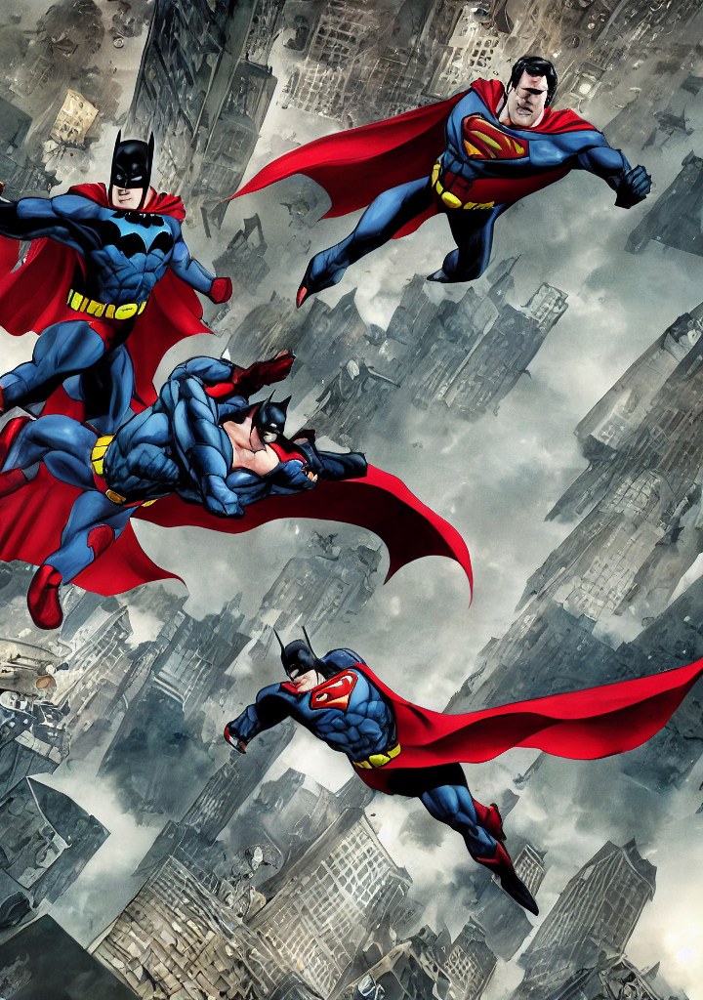

In [17]:
c_img1

In [8]:
c_img2=mypipe(p2,generator=generator,height=h,width=w,num_inference_steps=500).images[0]

NameError: ignored

In [9]:
c_img2

NameError: ignored

## runwayml/stable-diffusion-v1-5

In [23]:
from diffusers import StableDiffusionPipeline

model_id = "runwayml/stable-diffusion-v1-5"
runpipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, revision="fp16")
runpipe = runpipe.to("cuda")

vae/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [25]:
rimg1=runpipe(p1,generator=generator,height=h,width=w,num_inference_steps=200).images[0]

  0%|          | 0/200 [00:00<?, ?it/s]

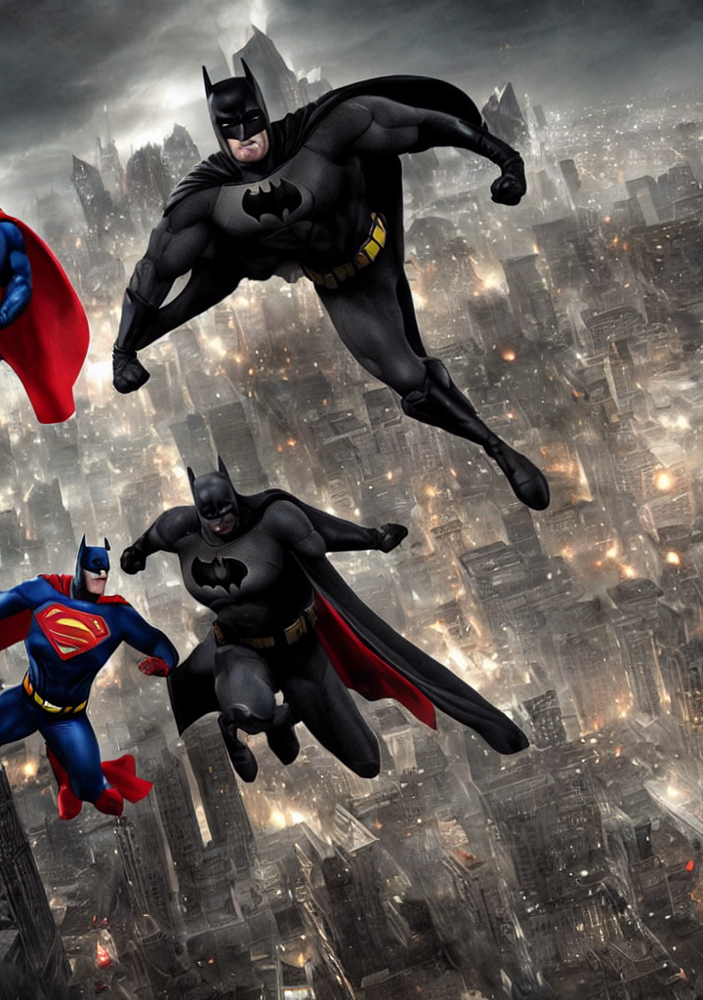

In [27]:
rimg1

In [28]:
rimg1=runpipe(p1,generator=generator,height=h,width=w,num_inference_steps=500).images[0]

  0%|          | 0/500 [00:00<?, ?it/s]

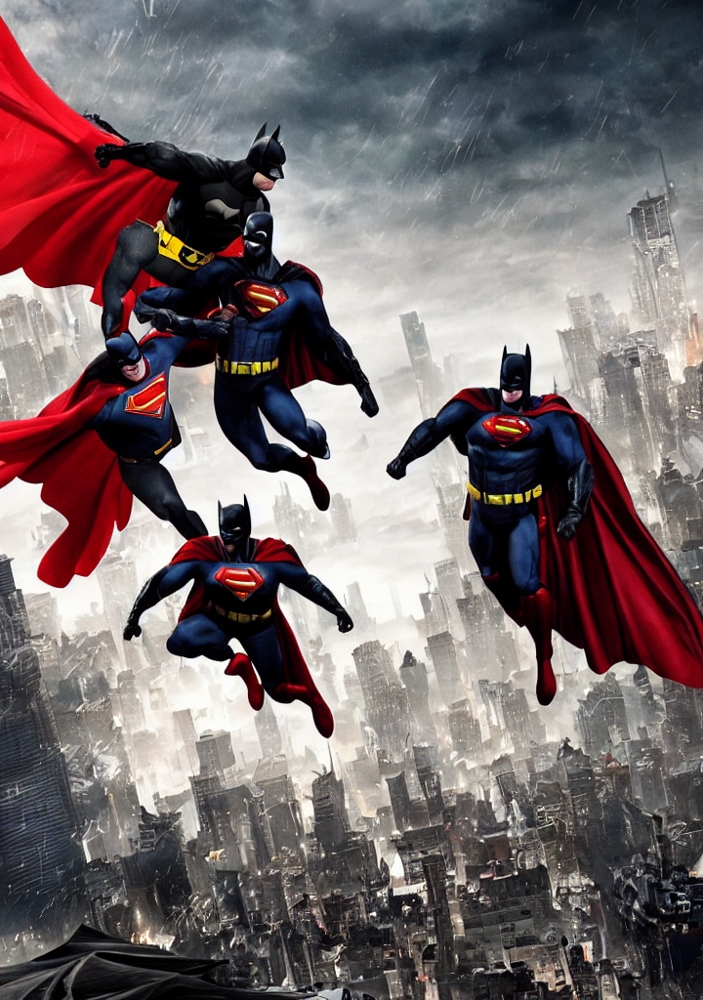

In [32]:
rimg1

In [37]:
rimg2=runpipe(p2,generator=generator,height=h,width=w,num_inference_steps=500).images[0]

  0%|          | 0/500 [00:00<?, ?it/s]

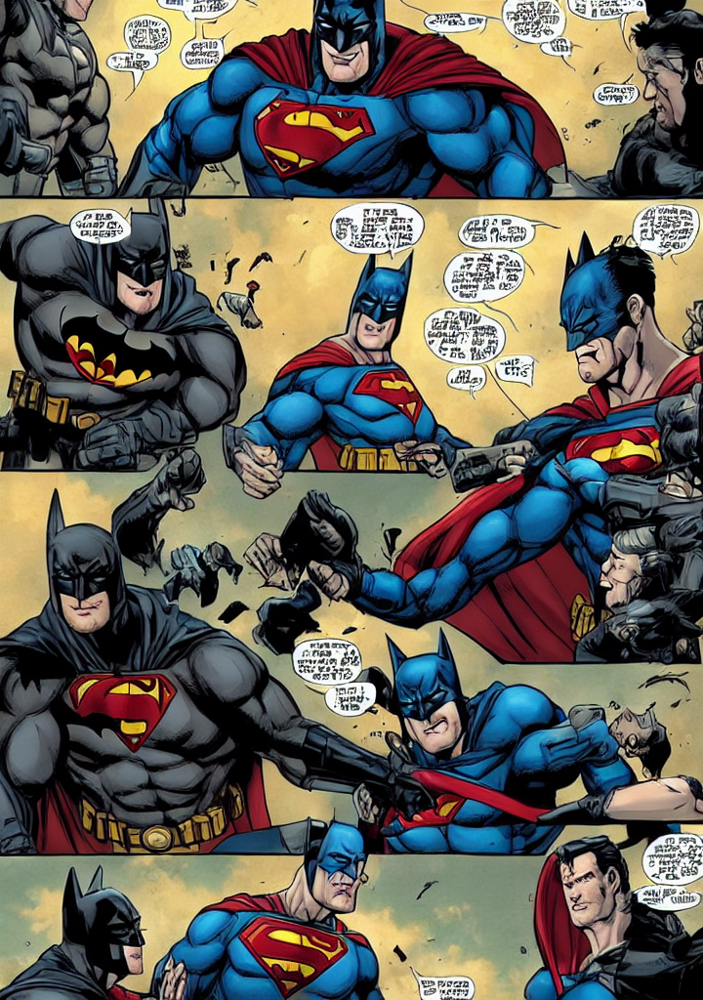

In [41]:
rimg2

###Inpainting with Stable Diffusion using "runwayml/stable-diffusion-inpainting" model

In [30]:
from diffusers import StableDiffusionInpaintPipeline

pipe3 = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    revision="fp16",
    torch_dtype=torch.float16,
)

vae/diffusion_pytorch_model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [39]:
pipe3 = pipe3.to("cuda")

In [50]:
from PIL import Image

# creating a object
im = Image.open(r"/content/img.jpg")
im.show()

In [49]:
p3img1=pipe3(p1,rimg1,im,num_inference_steps=500).images[0]

  0%|          | 0/500 [00:00<?, ?it/s]

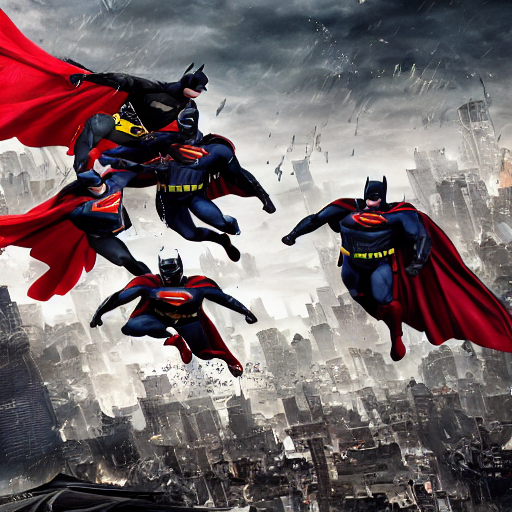

In [53]:
p3img1

In [54]:
p3img2=pipe3(p2,rimg2,im,num_inference_steps=500).images[0]

  0%|          | 0/500 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


In [2]:
from diffusers import DiffusionPipeline

comicpipeline = DiffusionPipeline.from_pretrained("ogkalu/Comic-Diffusion")

vae/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


now i am trying to use a Comic AI diffusion model

In [3]:
comicpipeline = comicpipeline.to("cuda")

In [4]:
p1="A photorealistic image of Batman and Superman fighting in a city. Batman is wearing his black Batsuit and Superman is wearing his red and blue Superman suit. They are both in mid-air, facing each other. The city is in ruins around them, with buildings and cars flying. The sky is dark and stormy."

In [7]:
comic1=comicpipeline(p1,num_inference_steps=300).images[0]

  0%|          | 0/300 [00:00<?, ?it/s]

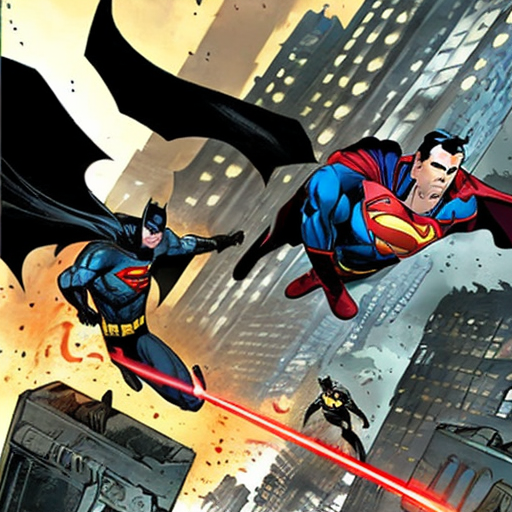

In [8]:
comic1

In [11]:
comic2=comicpipeline(p2,num_inference_steps=300).images[0]

  0%|          | 0/300 [00:00<?, ?it/s]

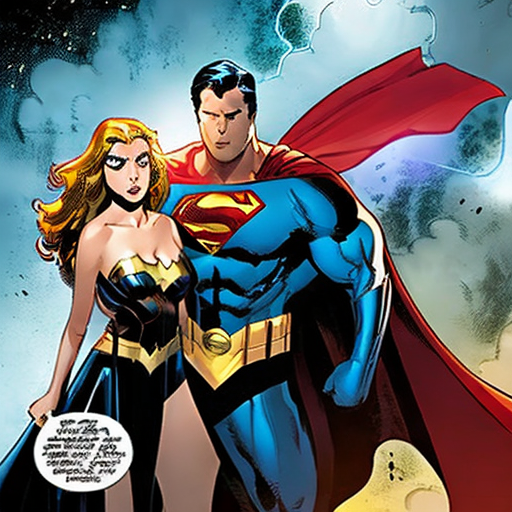

In [13]:
comic2

I have used prompts from https://publicprompts.art/comic-art/ website

In [12]:
p3='Retro comic style artwork, highly detailed James Bond, comic book cover, symmetrical, vibrant'

In [14]:
comic3=comicpipeline(p3,num_inference_steps=300).images[0]

  0%|          | 0/300 [00:00<?, ?it/s]

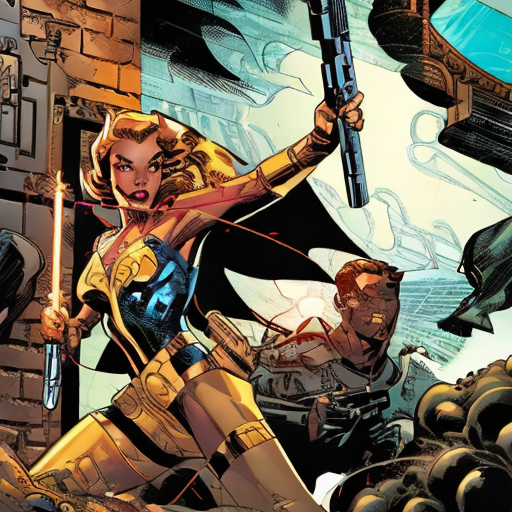

In [15]:
comic3

In [17]:
p4="Vogue Panda animal, a portrait hipster rapper, atompunk style, highly detailed and intricated, concept art, retro colors, Art Station, octane render, unreal engine, 8k, trending on artstation, Gorgeous"


In [23]:
comic4=comicpipeline(p4,num_inference_steps=500).images[0]

  0%|          | 0/500 [00:00<?, ?it/s]

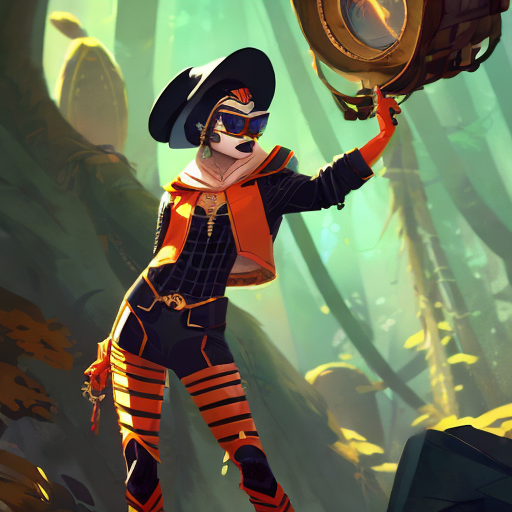

In [25]:
comic4

In [24]:
from diffusers import DiffusionPipeline

borline = DiffusionPipeline.from_pretrained("PublicPrompts/borderlands")

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [29]:
borline = borline.to("cuda")

In [30]:
bore1=borline(p3,num_inference_steps=500).images[0]

  0%|          | 0/500 [00:00<?, ?it/s]

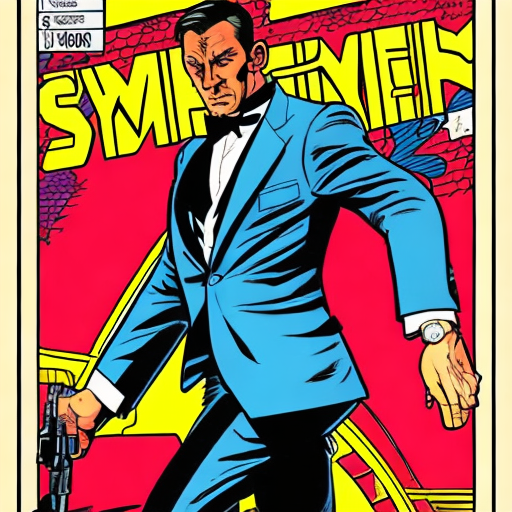

In [32]:
bore1

In [33]:
bore1=borline(p4,num_inference_steps=500).images[0]

  0%|          | 0/500 [00:00<?, ?it/s]

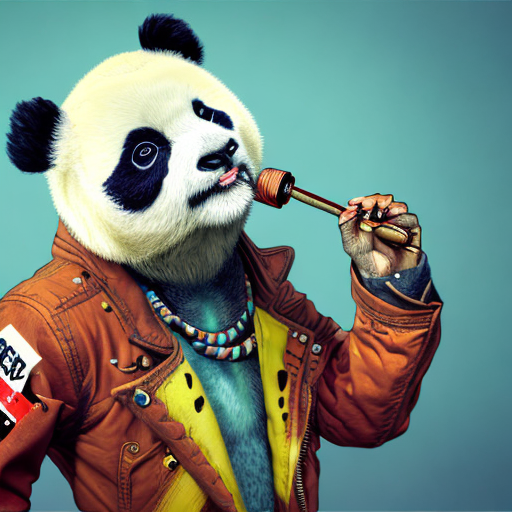

In [34]:
bore1